In [1]:
import numpy as np 
import pandas as pd
import json 
import csv
import nltk
import unicodedata
import re
import sys
from gensim.models.coherencemodel import CoherenceModel
from gensim import corpora, models
from gensim.utils import simple_preprocess
import gensim, spacy
from gensim.models.ldamulticore import LdaMulticore
import re
from gensim.models import Phrases
from gensim.models.phrases import Phraser

import os

In [2]:
# pip install git+https://github.com/rwalk/gsdmm.git

In [3]:
from gsdmm import MovieGroupProcess

In [4]:
df = pd.read_csv("../pos_neg_india.csv")
df

,Unnamed: 0,index,Text,new_text,languages,translated,new_languages,pos_tagged_words,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment
0,0,0,soniya mummy hoti toh covid me magic stick ghu...,soniya mummy hoti toh covid me magic stick ghu...,Unknown,soniya mummy hoti toh covid me magic stick ghu...,Unknown,"[('soniya', 'JJ'), ('mummy', 'NN'), ('hot', 'J...","['soniya', 'mummy', 'hot', 'toh', 'couid', 'ma...",['death'],['death'],subjective,0
1,12,12,is covid ki waja se buht saray logon ne apne p...,is covid ki waja se buht saray logon ne apne p...,Unknown,is covid ki waja se buht saray logon ne apne p...,Unknown,"[('is', 'VBZ'), ('couid', 'JJ'), ('ki', 'NN'),...","['couid', 'ki', 'raja', 'se', 'spray', 'logon'...","['hair', 'ply', 'vaccination']","['hair', 'ply', 'vaccination']",subjective,2
2,18,18,deaths due covid what is vaccination rate what...,deaths due covid what is vaccination rate what...,"ENGLISH, Unknown",deaths due covid what is vaccination rate what...,"ENGLISH, Unknown","[('deaths', 'NNS'), ('due', 'JJ'), ('couid', '...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'couid', 'vaccination', 'rate', 'har...",subjective,2
3,28,28,vaccination against covid- 19 is necessity tod...,vaccination against covid- 19 is necessity tod...,ENGLISH,vaccination against covid- 19 is necessity tod...,ENGLISH,"[('vaccination', 'NN'), ('against', 'IN'), ('c...","['vaccination', 'couid', 'nineteen', 'necessit...","['necessity', 'today', 'scenario', 'hope', 'pr...","['necessity', 'today', 'scenario', 'problem']",subjective,2
4,33,33,very surprising that unvaccinated population &...,very surprising that unvaccinated population &...,ENGLISH,very surprising that unvaccinated population &...,ENGLISH,"[('very', 'RB'), ('surprising', 'JJ'), ('that'...","['surprising', 'vaccinated', 'population', 'yr...","['surprising', 'vaccinated', 'population', 'yr...","['population', 'yrs', 'offline', 'class', 'amp...",subjective,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
37618,95179,95179,nature seems have already started working savi...,nature seems have already started working savi...,ENGLISH,nature seems have already started working savi...,ENGLISH,"[('nature', 'NN'), ('seems', 'VBZ'), ('have', ...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'generation', 'vaccinesaveslive', '...",subjective,2
37619,95180,95180,"dear , we #india 🇮🇳has helped this #world incl...","dear , we #india Indiahas helped this #world i...",ENGLISH,"dear , we #india Indiahas helped this #world i...",ENGLISH,"[('dear', 'IN'), ('we', 'PRP'), ('india', 'VBP...","['dear', 'india', 'indians', 'help', 'world', ...","['dear', 'help', 'world', 'include', 'kindness...","['world', 'kindnessmatter', 'vaccinesaveslive']",subjective,2
37620,95184,95184,our sincere request state central govt 🙏🙏. ple...,our sincere request state central govt folded_...,ENGLISH,our sincere request state central govt folded_...,ENGLISH,"[('our', 'PRP$'), ('sincere', 'JJ'), ('request...","['sincere', 'request', 'state', 'central', 'go...","['sincere', 'request', 'state', 'central', 'go...","['request', 'state', 'govt', 'share', 'vaccine...",subjective,2
37621,95185,95185,thanks your appreciation valuable feedback abo...,thanks your appreciation valuable feedback abo...,ENGLISH,thanks your appreciation valuable feedback abo...,ENGLISH,"[('thanks', 'NNS'), ('your', 'PRP$'), ('apprec...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'feedback', 'vaccine...",subjective,2


In [5]:
df.drop(columns = ['Unnamed: 0', 'Text', 'index', 'new_text', 'languages', 'new_languages', 'pos_tagged_words'], inplace = True)
df

,translated,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment
0,soniya mummy hoti toh covid me magic stick ghu...,"['soniya', 'mummy', 'hot', 'toh', 'couid', 'ma...",['death'],['death'],subjective,0
1,is covid ki waja se buht saray logon ne apne p...,"['couid', 'ki', 'raja', 'se', 'spray', 'logon'...","['hair', 'ply', 'vaccination']","['hair', 'ply', 'vaccination']",subjective,2
2,deaths due covid what is vaccination rate what...,"['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'couid', 'vaccination', 'rate', 'har...",subjective,2
3,vaccination against covid- 19 is necessity tod...,"['vaccination', 'couid', 'nineteen', 'necessit...","['necessity', 'today', 'scenario', 'hope', 'pr...","['necessity', 'today', 'scenario', 'problem']",subjective,2
4,very surprising that unvaccinated population &...,"['surprising', 'vaccinated', 'population', 'yr...","['surprising', 'vaccinated', 'population', 'yr...","['population', 'yrs', 'offline', 'class', 'amp...",subjective,0
...,...,...,...,...,...,...
37618,nature seems have already started working savi...,"['nature', 'seem', 'already', 'start', 'work',...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'generation', 'vaccinesaveslive', '...",subjective,2
37619,"dear , we #india Indiahas helped this #world i...","['dear', 'india', 'indians', 'help', 'world', ...","['dear', 'help', 'world', 'include', 'kindness...","['world', 'kindnessmatter', 'vaccinesaveslive']",subjective,2
37620,our sincere request state central govt folded_...,"['sincere', 'request', 'state', 'central', 'go...","['sincere', 'request', 'state', 'central', 'go...","['request', 'state', 'govt', 'share', 'vaccine...",subjective,2
37621,thanks your appreciation valuable feedback abo...,"['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'feedback', 'vaccine...",subjective,2


In [6]:
df['words_processed_all'].values[0][0]

'['

In [7]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

In [8]:
tokens_words_processed_all = list(sent_to_words(df['words_processed_all']))

In [9]:
from nltk.corpus import stopwords
stop_list = stopwords.words('english')
high_freq_known_words = ['covid','couid', 'pfizer', 'amp', 'people', 'covidvaccine', 'covishield', 'moderna', 'vaccine', 'astrazeneca', 'vaccinate', 'vaccinated', 'vaccination', 'vaccines']

stop_list.extend(high_freq_known_words)

test_words_only1 = ['not', 'vaccine', 'covid', 'and', 'vegan', 'cruelty', 'free', 'i', 'use', 'elf', 'cosmetics', 'every', 'day', 'and', 'i', 'love', 'it']
test_stopremoved = [w for w in test_words_only1 if w not in stop_list or w == 'not']
print(test_stopremoved)

['not', 'vegan', 'cruelty', 'free', 'use', 'elf', 'cosmetics', 'every', 'day', 'love']


In [10]:
stop_list

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [11]:
df['words_processed_all'] = tokens_words_processed_all

In [12]:
# remove stop words from tokenised_words_only

tokenised_stopremoved = [[w for w in each if w not in stop_list or w == 'not'] for each in tokens_words_processed_all]
tokenised_stopremoved

[['soniya',
  'mummy',
  'hot',
  'toh',
  'magic',
  'stick',
  'huma',
  'ke',
  'death',
  'kam',
  'kar',
  'deli',
  'aur',
  'rahul',
  'baba',
  'ape',
  'hadto',
  'se',
  'tayyar',
  'kake',
  'data'],
 ['ki',
  'raja',
  'se',
  'spray',
  'logon',
  'ne',
  'ape',
  'pardon',
  'ko',
  'khoja',
  'hai',
  'sare',
  'log',
  'ani',
  'jan',
  'se',
  'hath',
  'bethe',
  'agr',
  'ap',
  'susan',
  'se',
  'bacha',
  'chaste',
  'hair',
  'ply',
  'larva'],
 ['death',
  'due',
  'rate',
  'free',
  'safe',
  'sir',
  'gallian',
  'nikola',
  'ata',
  'tuck',
  'congress',
  'mubarak',
  'kashmir',
  'nha',
  'se',
  'kashmiri',
  'pandit',
  'ko',
  'braga',
  'mar',
  'gay',
  'harm',
  'parivartan',
  'rne',
  'bola',
  'gay',
  'wo',
  'mubarak',
  'dunny',
  'ke',
  'mubarak',
  'nai',
  'koi',
  'mubarak',
  'kashmir',
  'nha',
  'se',
  'kashmiri',
  'pandit',
  'ko',
  'braga',
  'mar',
  'gay',
  'harm'],
 ['nineteen',
  'necessity',
  'today',
  'scenario',
  'hoping

In [13]:
df['words_processed_all'].values[0][0]

'soniya'

In [14]:
df['tokenised_stopremoved'] = tokenised_stopremoved

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37623 entries, 0 to 37622
Data columns (total 7 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   translated                         37623 non-null  object
 1   words_processed_all                37623 non-null  object
 2   words_processed_noun_adj_verb_adv  37623 non-null  object
 3   words_processed_noun               37623 non-null  object
 4   text_type                          37623 non-null  object
 5   sentiment                          37623 non-null  int64 
 6   tokenised_stopremoved              37623 non-null  object
dtypes: int64(1), object(6)
memory usage: 2.0+ MB


# GSDMM for the topic modeling: 

In [16]:
np.random.seed(0)

In [17]:
df.info() # no empty rows

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37623 entries, 0 to 37622
Data columns (total 7 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   translated                         37623 non-null  object
 1   words_processed_all                37623 non-null  object
 2   words_processed_noun_adj_verb_adv  37623 non-null  object
 3   words_processed_noun               37623 non-null  object
 4   text_type                          37623 non-null  object
 5   sentiment                          37623 non-null  int64 
 6   tokenised_stopremoved              37623 non-null  object
dtypes: int64(1), object(6)
memory usage: 2.0+ MB


In [18]:
df['sentiment'].value_counts()

0    20029
2    17594
Name: sentiment, dtype: int64

In [19]:
positive_df = df[df['sentiment'] == 2]

In [20]:
positive_df

,translated,words_processed_all,words_processed_noun_adj_verb_adv,words_processed_noun,text_type,sentiment,tokenised_stopremoved
1,is covid ki waja se buht saray logon ne apne p...,"[couid, ki, raja, se, spray, logon, ne, ape, p...","['hair', 'ply', 'vaccination']","['hair', 'ply', 'vaccination']",subjective,2,"[ki, raja, se, spray, logon, ne, ape, pardon, ..."
2,deaths due covid what is vaccination rate what...,"[death, due, couid, vaccination, rate, free, s...","['death', 'due', 'couid', 'vaccination', 'rate...","['death', 'couid', 'vaccination', 'rate', 'har...",subjective,2,"[death, due, rate, free, safe, sir, gallian, n..."
3,vaccination against covid- 19 is necessity tod...,"[vaccination, couid, nineteen, necessity, toda...","['necessity', 'today', 'scenario', 'hope', 'pr...","['necessity', 'today', 'scenario', 'problem']",subjective,2,"[nineteen, necessity, today, scenario, hoping,..."
5,dr. deserved #1 minister's award his exception...,"[deserved, one, minister, award, exceptional, ...","['deserved', 'way', 'manage', 'thing', 'millen...","['way', 'thing', 'millennium', 'peril', 'couid...",subjective,2,"[deserved, one, minister, award, exceptional, ..."
6,"yeah i still do not get why, symptoms are much...","[yeah, still, not, get, symptom, much, le, sev...","['still', 'symptom', 'much', 'less', 'severe',...","['symptom', 'vaccination', 'example', 'country...",subjective,2,"[yeah, still, not, get, symptom, much, le, sev..."
...,...,...,...,...,...,...,...
37618,nature seems have already started working savi...,"[nature, seem, already, start, work, save, nex...","['nature', 'seem', 'already', 'start', 'work',...","['nature', 'generation', 'vaccinesaveslive', '...",subjective,2,"[nature, seem, already, start, work, save, nex..."
37619,"dear , we #india Indiahas helped this #world i...","[dear, india, indians, help, world, include, u...","['dear', 'help', 'world', 'include', 'kindness...","['world', 'kindnessmatter', 'vaccinesaveslive']",subjective,2,"[dear, india, indians, help, world, include, u..."
37620,our sincere request state central govt folded_...,"[sincere, request, state, central, govt, pleas...","['sincere', 'request', 'state', 'central', 'go...","['request', 'state', 'govt', 'share', 'vaccine...",subjective,2,"[sincere, request, state, central, govt, pleas..."
37621,thanks your appreciation valuable feedback abo...,"[thank, appreciation, valuable, feedback]","['thank', 'appreciation', 'valuable', 'feedbac...","['thank', 'appreciation', 'feedback', 'vaccine...",subjective,2,"[thank, appreciation, valuable, feedback]"


In [21]:
positive_df['tokenised_stopremoved'].values[0][0]

'ki'

In [22]:
positive_tokenised_lemmatized = list(sent_to_words(positive_df['tokenised_stopremoved']))

In [23]:
positive_tokenised_lemmatized[0][0]

'ki'

In [24]:
len(positive_tokenised_lemmatized)

17594

In [25]:
def top_words(cluster_word_distribution, top_cluster, values):
    for cluster in top_cluster:
        sort_dicts =sorted(mgp.cluster_word_distribution[cluster].items(), key=lambda k: k[1], reverse=True)[:values]
        print("\nCluster %s : %s"%(cluster,sort_dicts))

### Cluster size: 4

In [26]:
mgp = MovieGroupProcess(K=4, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 11887 clusters with 4 clusters populated
In stage 1: transferred 8039 clusters with 4 clusters populated
In stage 2: transferred 6125 clusters with 4 clusters populated
In stage 3: transferred 4442 clusters with 4 clusters populated
In stage 4: transferred 3489 clusters with 4 clusters populated
In stage 5: transferred 2994 clusters with 4 clusters populated
In stage 6: transferred 2732 clusters with 4 clusters populated
In stage 7: transferred 2589 clusters with 4 clusters populated
In stage 8: transferred 2587 clusters with 4 clusters populated
In stage 9: transferred 2568 clusters with 4 clusters populated
In stage 10: transferred 2463 clusters with 4 clusters populated
In stage 11: transferred 2461 clusters with 4 clusters populated
In stage 12: transferred 2433 clusters with 4 clusters populated
In stage 13: transferred 2525 clusters with 4 clusters populated
In stage 14: transferred 2510 clusters with 4 clusters populated
In stage 15: transferred 2493 clus

In [27]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [5973 4683 6073  865]

Most important clusters (by number of docs inside): [2 0 1 3]

Cluster 2 : [('get', 3691), ('not', 1386), ('safe', 950), ('take', 925), ('dose', 908), ('thank', 742), ('nineteen', 689), ('first', 596), ('today', 591), ('fully', 559)]

Cluster 0 : [('not', 2233), ('get', 1520), ('india', 1489), ('one', 799), ('country', 645), ('nineteen', 633), ('good', 546), ('make', 509), ('take', 489), ('indian', 458)]

Cluster 1 : [('get', 2069), ('not', 1470), ('thank', 802), ('please', 773), ('sir', 764), ('help', 654), ('dose', 564), ('fully', 472), ('one', 459), ('center', 456)]

Cluster 3 : [('hai', 531), ('ki', 189), ('ke', 166), ('se', 165), ('nazi', 165), ('ka', 161), ('ko', 147), ('get', 122), ('hi', 117), ('ho', 114)]


In [28]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [29]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [30]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 4,"[ki, raja, se, spray, logon, ne, ape, pardon, ..."
1,deaths due covid what is vaccination rate what...,type 4,"[death, due, rate, free, safe, sir, gallian, n..."
2,vaccination against covid- 19 is necessity tod...,type 2,"[nineteen, necessity, today, scenario, hoping,..."
3,dr. deserved #1 minister's award his exception...,type 2,"[deserved, one, minister, award, exceptional, ..."
4,"yeah i still do not get why, symptoms are much...",type 2,"[yeah, still, not, get, symptom, much, le, sev..."


In [31]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [32]:
result['Topic']

0        type 4
1        type 4
2        type 2
3        type 2
4        type 2
          ...  
17589    type 2
17590    type 2
17591    type 3
17592    type 3
17593    type 1
Name: Topic, Length: 17594, dtype: object

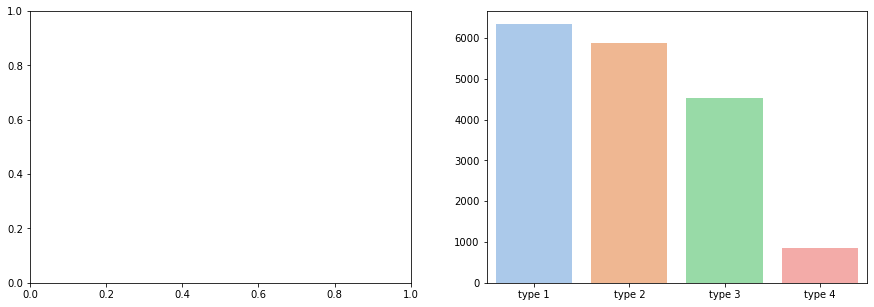

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [34]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 4,"[ki, raja, se, spray, logon, ne, ape, pardon, ...",37
1,deaths due covid what is vaccination rate what...,type 4,"[death, due, rate, free, safe, sir, gallian, n...",61
2,vaccination against covid- 19 is necessity tod...,type 2,"[nineteen, necessity, today, scenario, hoping,...",17
3,dr. deserved #1 minister's award his exception...,type 2,"[deserved, one, minister, award, exceptional, ...",32
4,"yeah i still do not get why, symptoms are much...",type 2,"[yeah, still, not, get, symptom, much, le, sev...",39


In [35]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [36]:
result = result.drop('Lemma-text', axis=1)

In [37]:
from wordcloud import WordCloud 

In [38]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

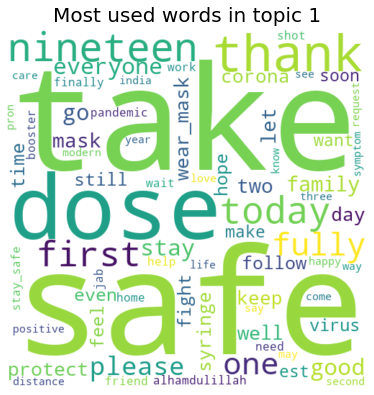

In [39]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

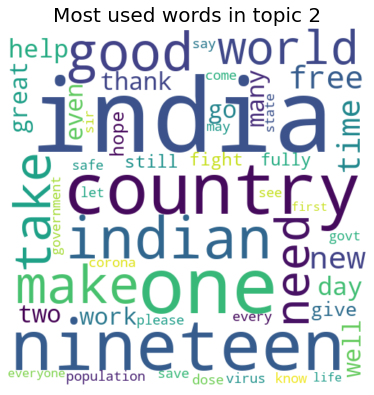

In [40]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

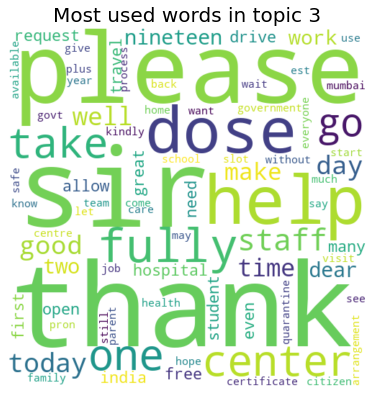

In [41]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

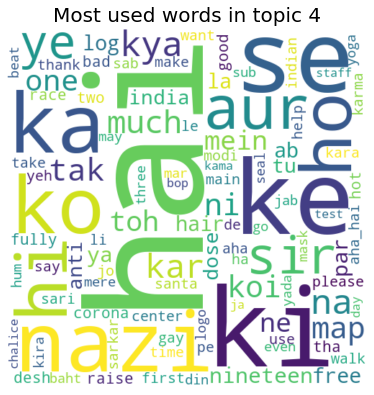

In [42]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

In [43]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

ValueError: We need at least 1 word to plot a word cloud, got 0.

### Cluster size: 5

In [44]:
mgp = MovieGroupProcess(K=5, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 12721 clusters with 5 clusters populated
In stage 1: transferred 8541 clusters with 5 clusters populated
In stage 2: transferred 6331 clusters with 5 clusters populated
In stage 3: transferred 4618 clusters with 5 clusters populated
In stage 4: transferred 3587 clusters with 5 clusters populated
In stage 5: transferred 3147 clusters with 5 clusters populated
In stage 6: transferred 3031 clusters with 5 clusters populated
In stage 7: transferred 2919 clusters with 5 clusters populated
In stage 8: transferred 2899 clusters with 5 clusters populated
In stage 9: transferred 2814 clusters with 5 clusters populated
In stage 10: transferred 2820 clusters with 5 clusters populated
In stage 11: transferred 2833 clusters with 5 clusters populated
In stage 12: transferred 2904 clusters with 5 clusters populated
In stage 13: transferred 2870 clusters with 5 clusters populated
In stage 14: transferred 2865 clusters with 5 clusters populated
In stage 15: transferred 2794 clus

In [45]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [4426 3410 5088 3887  783]

Most important clusters (by number of docs inside): [2 0 3 1 4]

Cluster 2 : [('not', 2258), ('get', 1966), ('please', 770), ('fully', 690), ('one', 629), ('sir', 621), ('dose', 600), ('help', 597), ('go', 555), ('take', 544)]

Cluster 0 : [('not', 1441), ('india', 1365), ('get', 1046), ('one', 572), ('country', 547), ('nineteen', 489), ('indian', 440), ('make', 430), ('world', 410), ('good', 405)]

Cluster 3 : [('get', 2018), ('not', 1175), ('safe', 701), ('nineteen', 589), ('take', 524), ('stay', 427), ('mask', 411), ('one', 399), ('please', 395), ('wear_mask', 356)]

Cluster 1 : [('get', 2274), ('thank', 1133), ('dose', 754), ('today', 636), ('first', 530), ('take', 456), ('safe', 355), ('nineteen', 316), ('good', 313), ('everyone', 310)]

Cluster 4 : [('hai', 526), ('ki', 185), ('se', 164), ('nazi', 163), ('ke', 162), ('ka', 158), ('ko', 147), ('ho', 117), ('hi', 117), ('get', 98)]


In [46]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [47]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [48]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 5,"[ki, raja, se, spray, logon, ne, ape, pardon, ..."
1,deaths due covid what is vaccination rate what...,type 5,"[death, due, rate, free, safe, sir, gallian, n..."
2,vaccination against covid- 19 is necessity tod...,type 3,"[nineteen, necessity, today, scenario, hoping,..."
3,dr. deserved #1 minister's award his exception...,type 2,"[deserved, one, minister, award, exceptional, ..."
4,"yeah i still do not get why, symptoms are much...",type 3,"[yeah, still, not, get, symptom, much, le, sev..."


In [49]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [50]:
result['Topic']

0        type 5
1        type 5
2        type 3
3        type 2
4        type 3
          ...  
17589    type 3
17590    type 2
17591    type 2
17592    type 4
17593    type 3
Name: Topic, Length: 17594, dtype: object

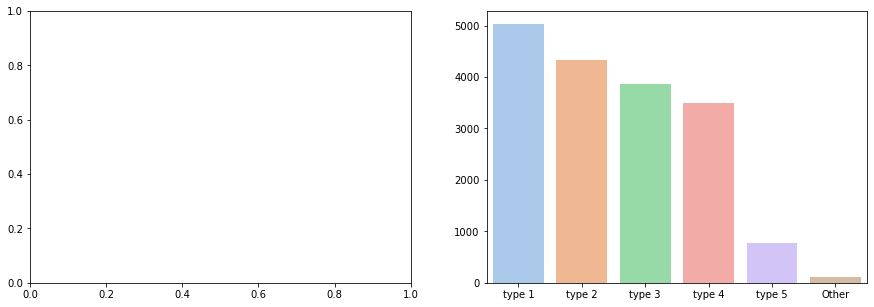

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [52]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 5,"[ki, raja, se, spray, logon, ne, ape, pardon, ...",37
1,deaths due covid what is vaccination rate what...,type 5,"[death, due, rate, free, safe, sir, gallian, n...",61
2,vaccination against covid- 19 is necessity tod...,type 3,"[nineteen, necessity, today, scenario, hoping,...",17
3,dr. deserved #1 minister's award his exception...,type 2,"[deserved, one, minister, award, exceptional, ...",32
4,"yeah i still do not get why, symptoms are much...",type 3,"[yeah, still, not, get, symptom, much, le, sev...",39


In [53]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [54]:
result = result.drop('Lemma-text', axis=1)

In [55]:
from wordcloud import WordCloud 

In [56]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

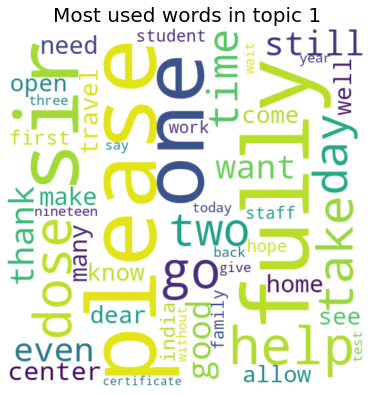

In [57]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

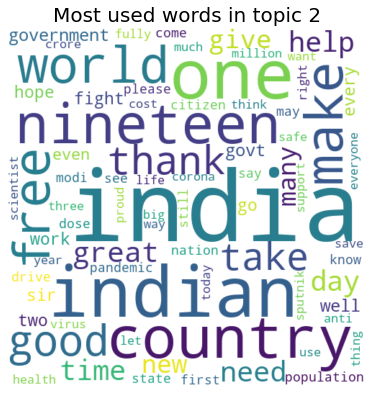

In [58]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

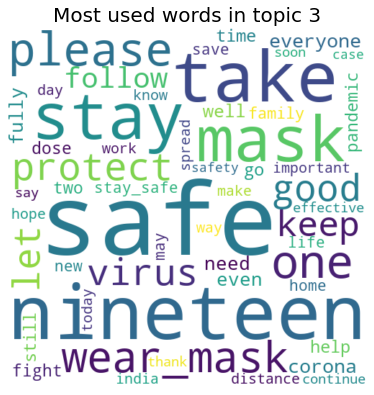

In [59]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

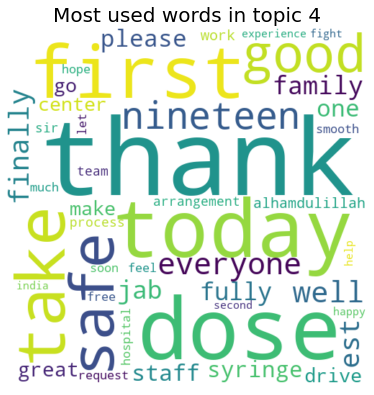

In [60]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

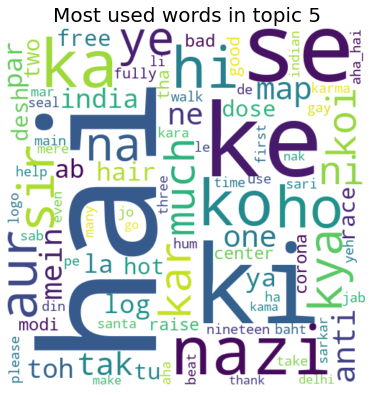

In [61]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

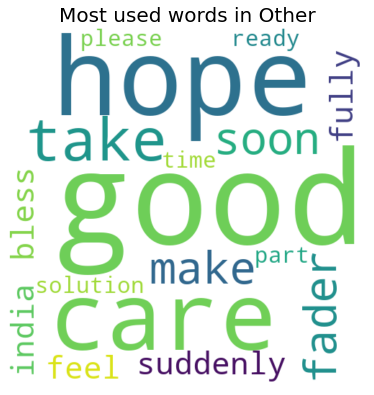

In [62]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 6

In [63]:
mgp = MovieGroupProcess(K=6, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 13318 clusters with 6 clusters populated
In stage 1: transferred 8979 clusters with 6 clusters populated
In stage 2: transferred 6128 clusters with 6 clusters populated
In stage 3: transferred 4668 clusters with 6 clusters populated
In stage 4: transferred 3915 clusters with 6 clusters populated
In stage 5: transferred 3490 clusters with 6 clusters populated
In stage 6: transferred 3313 clusters with 6 clusters populated
In stage 7: transferred 3163 clusters with 6 clusters populated
In stage 8: transferred 3123 clusters with 6 clusters populated
In stage 9: transferred 3060 clusters with 6 clusters populated
In stage 10: transferred 3095 clusters with 6 clusters populated
In stage 11: transferred 3055 clusters with 6 clusters populated
In stage 12: transferred 3072 clusters with 6 clusters populated
In stage 13: transferred 3042 clusters with 6 clusters populated
In stage 14: transferred 3018 clusters with 6 clusters populated
In stage 15: transferred 3111 clus

In [64]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [4262 1885 3149 4127  657 3514]

Most important clusters (by number of docs inside): [0 3 5 2 1 4]

Cluster 0 : [('get', 2124), ('not', 1454), ('safe', 693), ('nineteen', 641), ('take', 599), ('one', 471), ('mask', 430), ('please', 413), ('stay', 403), ('good', 385)]

Cluster 3 : [('not', 1369), ('india', 1312), ('get', 977), ('one', 554), ('country', 543), ('nineteen', 440), ('indian', 412), ('make', 408), ('world', 377), ('good', 376)]

Cluster 5 : [('not', 1521), ('get', 1389), ('please', 718), ('sir', 658), ('help', 597), ('fully', 431), ('one', 396), ('dose', 386), ('take', 334), ('go', 330)]

Cluster 2 : [('get', 2204), ('thank', 1102), ('dose', 703), ('today', 632), ('first', 490), ('take', 416), ('safe', 382), ('everyone', 284), ('nineteen', 283), ('well', 271)]

Cluster 1 : [('get', 632), ('not', 599), ('fully', 268), ('one', 217), ('go', 211), ('want', 201), ('take', 199), ('dose', 197), ('two', 196), ('good', 178)]

Cluster 4 : [('hai', 528), 

In [65]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [66]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [67]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 6,"[ki, raja, se, spray, logon, ne, ape, pardon, ..."
1,deaths due covid what is vaccination rate what...,type 6,"[death, due, rate, free, safe, sir, gallian, n..."
2,vaccination against covid- 19 is necessity tod...,type 4,"[nineteen, necessity, today, scenario, hoping,..."
3,dr. deserved #1 minister's award his exception...,type 4,"[deserved, one, minister, award, exceptional, ..."
4,"yeah i still do not get why, symptoms are much...",type 1,"[yeah, still, not, get, symptom, much, le, sev..."


In [68]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [69]:
result['Topic']

0        type 6
1        type 6
2        type 4
3        type 4
4        type 1
          ...  
17589    type 1
17590    type 2
17591    type 2
17592    type 4
17593    type 1
Name: Topic, Length: 17594, dtype: object

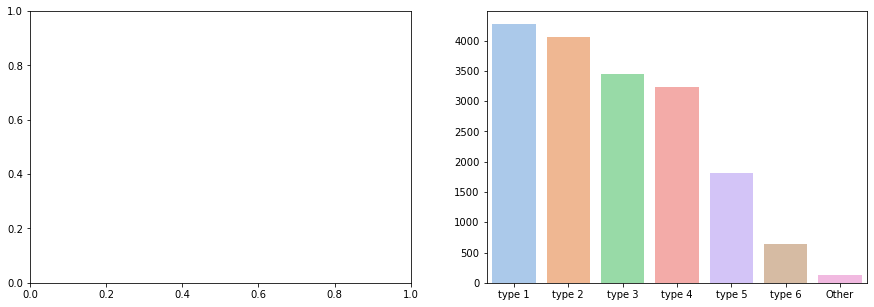

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [71]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 6,"[ki, raja, se, spray, logon, ne, ape, pardon, ...",37
1,deaths due covid what is vaccination rate what...,type 6,"[death, due, rate, free, safe, sir, gallian, n...",61
2,vaccination against covid- 19 is necessity tod...,type 4,"[nineteen, necessity, today, scenario, hoping,...",17
3,dr. deserved #1 minister's award his exception...,type 4,"[deserved, one, minister, award, exceptional, ...",32
4,"yeah i still do not get why, symptoms are much...",type 1,"[yeah, still, not, get, symptom, much, le, sev...",39


In [72]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [73]:
result = result.drop('Lemma-text', axis=1)

In [74]:
from wordcloud import WordCloud 

In [75]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

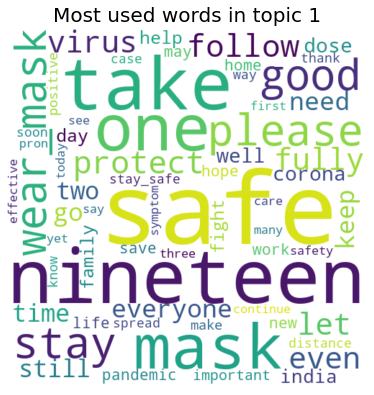

In [76]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

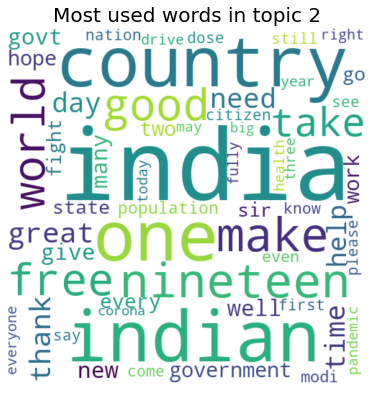

In [77]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

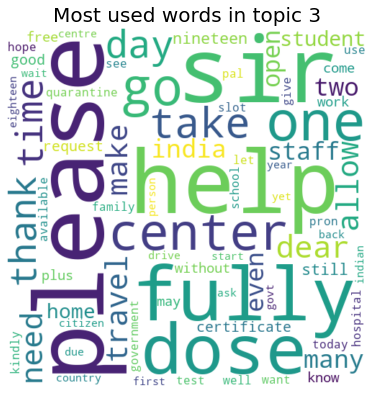

In [78]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

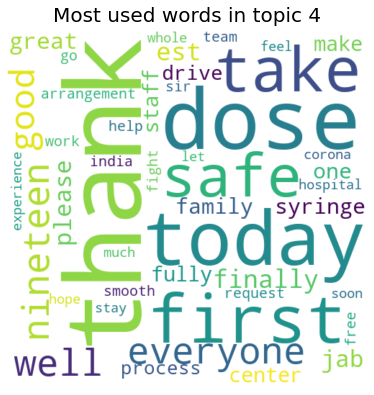

In [79]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

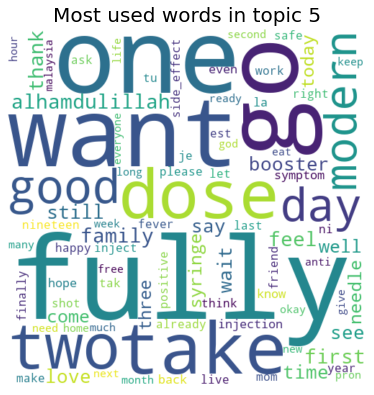

In [80]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

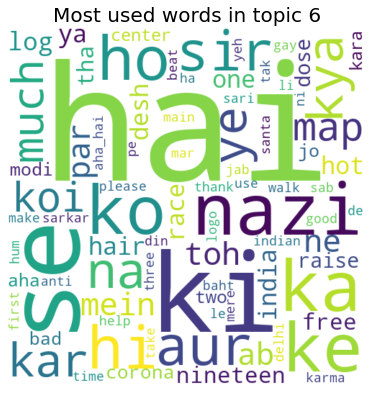

In [81]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

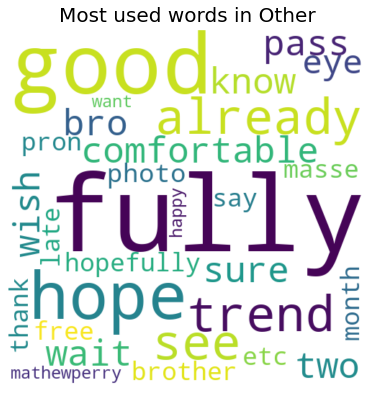

In [82]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 7

In [83]:
mgp = MovieGroupProcess(K=7, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 13586 clusters with 7 clusters populated
In stage 1: transferred 9174 clusters with 7 clusters populated
In stage 2: transferred 6872 clusters with 7 clusters populated
In stage 3: transferred 5390 clusters with 7 clusters populated
In stage 4: transferred 4542 clusters with 7 clusters populated
In stage 5: transferred 4139 clusters with 7 clusters populated
In stage 6: transferred 3849 clusters with 7 clusters populated
In stage 7: transferred 3715 clusters with 7 clusters populated
In stage 8: transferred 3439 clusters with 7 clusters populated
In stage 9: transferred 3322 clusters with 7 clusters populated
In stage 10: transferred 3357 clusters with 7 clusters populated
In stage 11: transferred 3229 clusters with 7 clusters populated
In stage 12: transferred 3270 clusters with 7 clusters populated
In stage 13: transferred 3213 clusters with 7 clusters populated
In stage 14: transferred 3128 clusters with 7 clusters populated
In stage 15: transferred 3108 clus

In [84]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [3089 2028  608 1301 3014 3093 4461]

Most important clusters (by number of docs inside): [6 5 0 4 1 3 2]

Cluster 6 : [('not', 1859), ('get', 1268), ('india', 1003), ('one', 695), ('good', 491), ('country', 474), ('take', 431), ('two', 366), ('day', 360), ('make', 357)]

Cluster 5 : [('not', 1338), ('get', 1293), ('please', 713), ('sir', 599), ('help', 565), ('fully', 403), ('dose', 382), ('take', 341), ('one', 338), ('go', 295)]

Cluster 0 : [('get', 2219), ('thank', 1092), ('dose', 742), ('today', 628), ('first', 520), ('take', 427), ('safe', 367), ('nineteen', 285), ('well', 280), ('good', 280)]

Cluster 4 : [('get', 1714), ('not', 878), ('safe', 603), ('nineteen', 485), ('take', 420), ('stay', 418), ('mask', 381), ('please', 360), ('wear_mask', 349), ('follow', 300)]

Cluster 1 : [('get', 486), ('india', 484), ('not', 399), ('nineteen', 288), ('free', 279), ('sir', 172), ('great', 171), ('help', 168), ('also', 168), ('indian', 168)]

Cluster 3 : [('

In [85]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [86]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [87]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 7,"[ki, raja, se, spray, logon, ne, ape, pardon, ..."
1,deaths due covid what is vaccination rate what...,type 7,"[death, due, rate, free, safe, sir, gallian, n..."
2,vaccination against covid- 19 is necessity tod...,type 3,"[nineteen, necessity, today, scenario, hoping,..."
3,dr. deserved #1 minister's award his exception...,type 5,"[deserved, one, minister, award, exceptional, ..."
4,"yeah i still do not get why, symptoms are much...",type 1,"[yeah, still, not, get, symptom, much, le, sev..."


In [88]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [89]:
result['Topic']

0        type 7
1        type 7
2        type 3
3        type 5
4        type 1
          ...  
17589    type 1
17590    type 1
17591    type 5
17592    type 3
17593    type 4
Name: Topic, Length: 17594, dtype: object

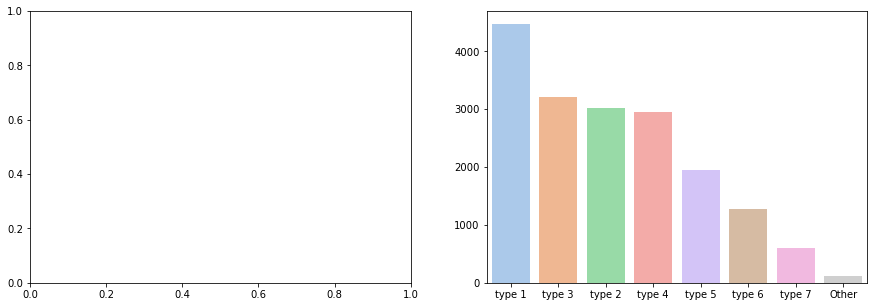

In [90]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [91]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 7,"[ki, raja, se, spray, logon, ne, ape, pardon, ...",37
1,deaths due covid what is vaccination rate what...,type 7,"[death, due, rate, free, safe, sir, gallian, n...",61
2,vaccination against covid- 19 is necessity tod...,type 3,"[nineteen, necessity, today, scenario, hoping,...",17
3,dr. deserved #1 minister's award his exception...,type 5,"[deserved, one, minister, award, exceptional, ...",32
4,"yeah i still do not get why, symptoms are much...",type 1,"[yeah, still, not, get, symptom, much, le, sev...",39


In [92]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [93]:
result = result.drop('Lemma-text', axis=1)

In [94]:
from wordcloud import WordCloud 

In [95]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

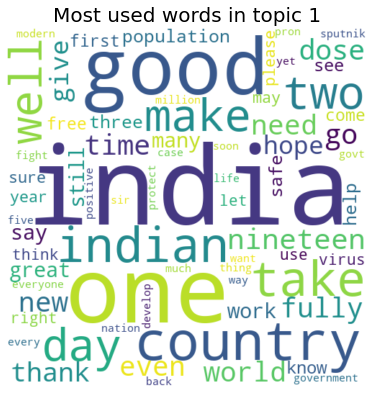

In [96]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

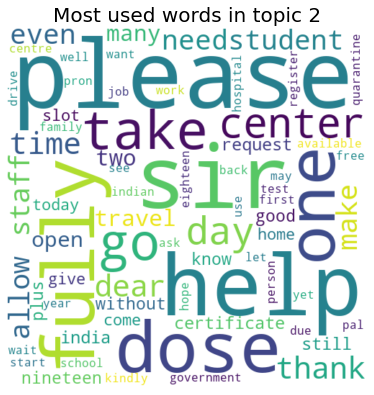

In [97]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

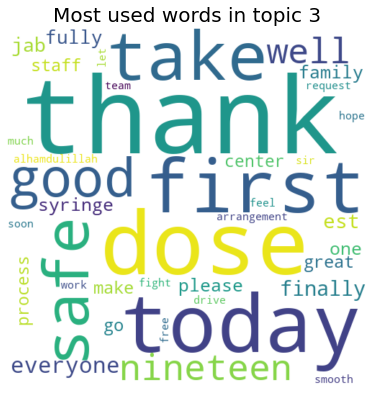

In [98]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

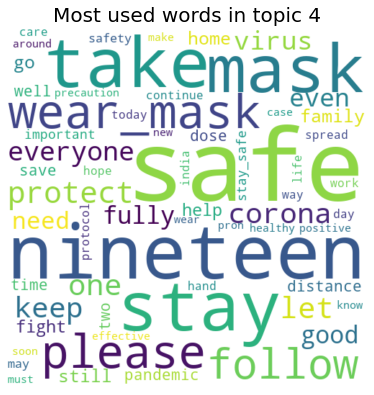

In [99]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

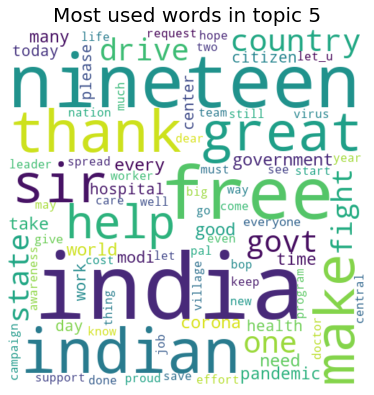

In [100]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

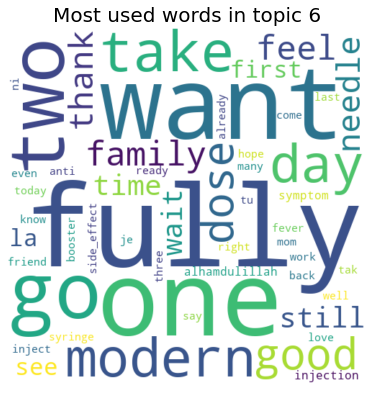

In [101]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

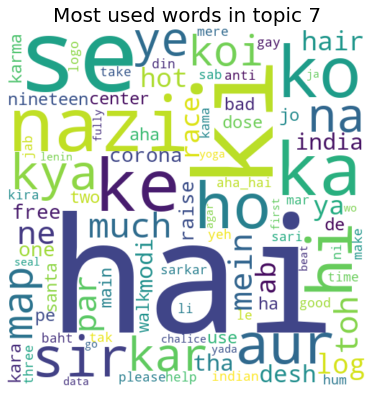

In [102]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

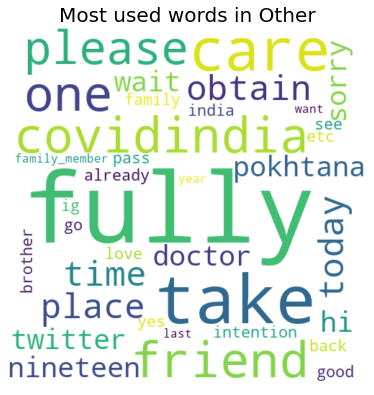

In [103]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 8

In [104]:
mgp = MovieGroupProcess(K=8, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 14040 clusters with 8 clusters populated
In stage 1: transferred 9552 clusters with 8 clusters populated
In stage 2: transferred 6734 clusters with 8 clusters populated
In stage 3: transferred 5228 clusters with 8 clusters populated
In stage 4: transferred 4196 clusters with 8 clusters populated
In stage 5: transferred 3680 clusters with 8 clusters populated
In stage 6: transferred 3384 clusters with 8 clusters populated
In stage 7: transferred 3247 clusters with 8 clusters populated
In stage 8: transferred 3121 clusters with 8 clusters populated
In stage 9: transferred 3056 clusters with 8 clusters populated
In stage 10: transferred 3064 clusters with 8 clusters populated
In stage 11: transferred 3087 clusters with 8 clusters populated
In stage 12: transferred 3003 clusters with 8 clusters populated
In stage 13: transferred 3001 clusters with 8 clusters populated
In stage 14: transferred 2926 clusters with 8 clusters populated
In stage 15: transferred 2855 clus

In [105]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [2117  606 4227   92 3313  183 4103 2953]

Most important clusters (by number of docs inside): [2 6 4 7 0 1 5 3]

Cluster 2 : [('get', 1990), ('not', 1538), ('safe', 636), ('take', 569), ('nineteen', 564), ('one', 497), ('mask', 437), ('please', 395), ('good', 394), ('stay', 373)]

Cluster 6 : [('not', 1365), ('india', 1315), ('get', 1012), ('one', 537), ('country', 526), ('nineteen', 433), ('indian', 417), ('make', 403), ('free', 393), ('world', 377)]

Cluster 4 : [('get', 2421), ('thank', 1092), ('dose', 758), ('today', 669), ('first', 529), ('take', 475), ('safe', 454), ('nineteen', 353), ('everyone', 327), ('well', 298)]

Cluster 7 : [('get', 1191), ('not', 1182), ('please', 668), ('sir', 648), ('help', 576), ('dose', 375), ('center', 336), ('one', 331), ('take', 303), ('fully', 247)]

Cluster 0 : [('not', 789), ('get', 678), ('fully', 384), ('go', 273), ('one', 257), ('two', 223), ('want', 218), ('take', 191), ('day', 191), ('good', 174)]

Cluster 1

In [106]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [107]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [108]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 6,"[ki, raja, se, spray, logon, ne, ape, pardon, ..."
1,deaths due covid what is vaccination rate what...,type 6,"[death, due, rate, free, safe, sir, gallian, n..."
2,vaccination against covid- 19 is necessity tod...,type 1,"[nineteen, necessity, today, scenario, hoping,..."
3,dr. deserved #1 minister's award his exception...,type 2,"[deserved, one, minister, award, exceptional, ..."
4,"yeah i still do not get why, symptoms are much...",type 1,"[yeah, still, not, get, symptom, much, le, sev..."


In [109]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [110]:
result['Topic']

0        type 6
1        type 6
2        type 1
3        type 2
4        type 1
          ...  
17589    type 1
17590    type 2
17591    type 2
17592    type 3
17593    type 1
Name: Topic, Length: 17594, dtype: object

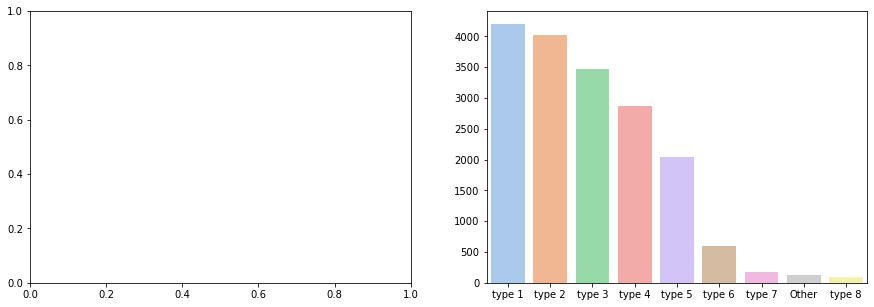

In [111]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [112]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 6,"[ki, raja, se, spray, logon, ne, ape, pardon, ...",37
1,deaths due covid what is vaccination rate what...,type 6,"[death, due, rate, free, safe, sir, gallian, n...",61
2,vaccination against covid- 19 is necessity tod...,type 1,"[nineteen, necessity, today, scenario, hoping,...",17
3,dr. deserved #1 minister's award his exception...,type 2,"[deserved, one, minister, award, exceptional, ...",32
4,"yeah i still do not get why, symptoms are much...",type 1,"[yeah, still, not, get, symptom, much, le, sev...",39


In [113]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [114]:
result = result.drop('Lemma-text', axis=1)

In [115]:
from wordcloud import WordCloud 

In [116]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

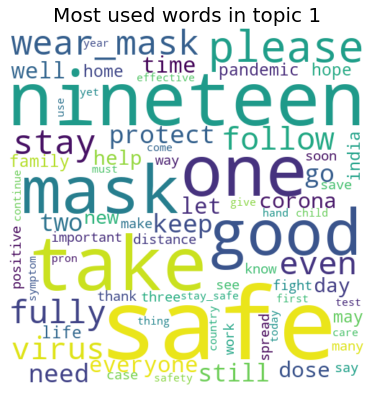

In [117]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

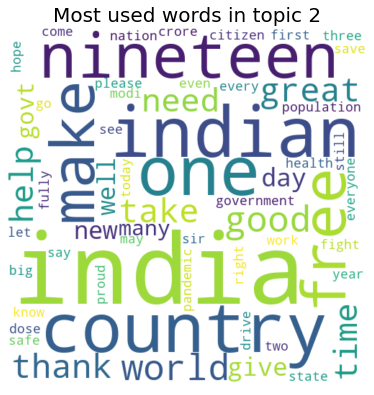

In [118]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

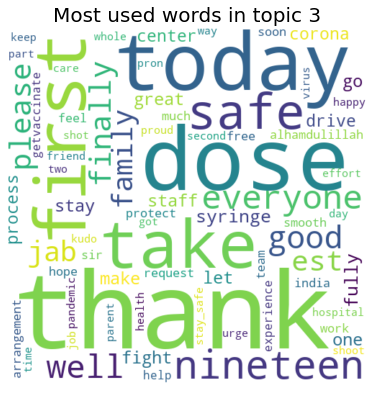

In [119]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

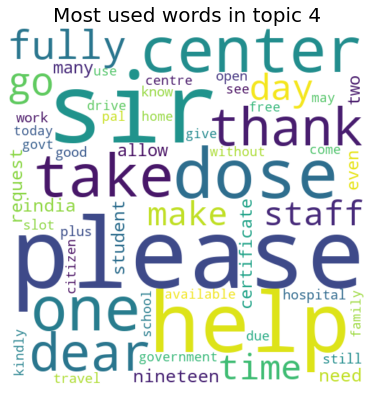

In [120]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

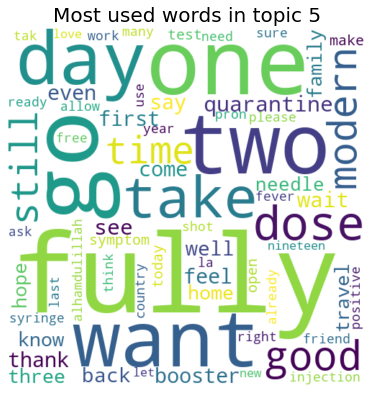

In [121]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

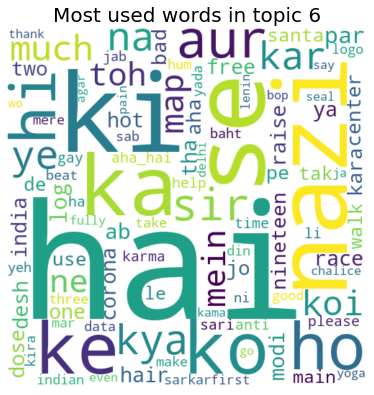

In [122]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

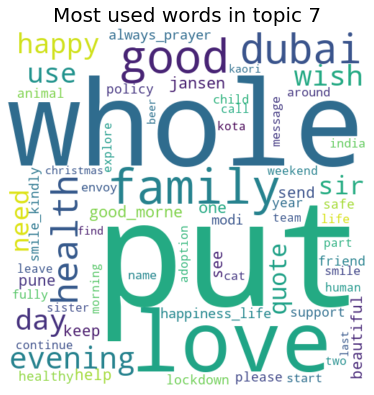

In [123]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

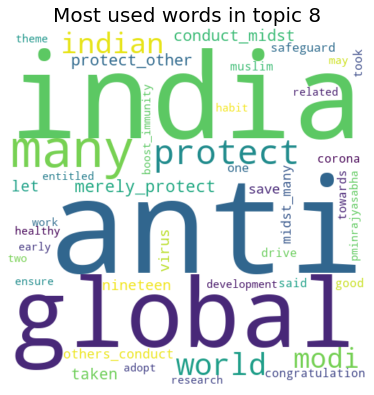

In [124]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

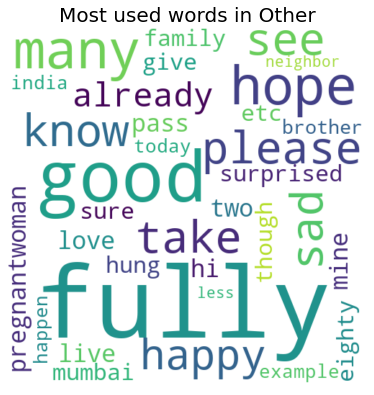

In [125]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 9

In [126]:
mgp = MovieGroupProcess(K=9, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 14306 clusters with 9 clusters populated
In stage 1: transferred 9951 clusters with 9 clusters populated
In stage 2: transferred 7114 clusters with 9 clusters populated
In stage 3: transferred 5336 clusters with 9 clusters populated
In stage 4: transferred 4422 clusters with 9 clusters populated
In stage 5: transferred 3879 clusters with 9 clusters populated
In stage 6: transferred 3535 clusters with 9 clusters populated
In stage 7: transferred 3421 clusters with 9 clusters populated
In stage 8: transferred 3309 clusters with 9 clusters populated
In stage 9: transferred 3210 clusters with 9 clusters populated
In stage 10: transferred 3215 clusters with 9 clusters populated
In stage 11: transferred 3164 clusters with 9 clusters populated
In stage 12: transferred 3154 clusters with 9 clusters populated
In stage 13: transferred 3129 clusters with 9 clusters populated
In stage 14: transferred 3119 clusters with 9 clusters populated
In stage 15: transferred 3085 clus

In [127]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [1512 4468 2860   61 1427  599 3088  448 3131]

Most important clusters (by number of docs inside): [1 8 6 2 0 4 5 7 3]

Cluster 1 : [('not', 1877), ('get', 1784), ('one', 665), ('take', 608), ('fully', 549), ('two', 482), ('go', 481), ('good', 473), ('dose', 459), ('nineteen', 388)]

Cluster 8 : [('not', 1327), ('get', 1226), ('please', 689), ('sir', 663), ('help', 548), ('fully', 362), ('dose', 340), ('one', 321), ('center', 317), ('take', 296)]

Cluster 6 : [('get', 2283), ('thank', 1071), ('dose', 722), ('today', 643), ('first', 508), ('take', 417), ('safe', 361), ('everyone', 294), ('well', 276), ('good', 271)]

Cluster 2 : [('not', 1152), ('india', 833), ('get', 744), ('country', 373), ('one', 364), ('indian', 294), ('make', 288), ('free', 286), ('good', 279), ('world', 272)]

Cluster 0 : [('india', 489), ('get', 310), ('nineteen', 274), ('not', 209), ('fight', 171), ('one', 164), ('country', 157), ('thank', 154), ('world', 148), ('great', 147)]

C

In [128]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8',
               'type 9'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [129]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [130]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 7,"[ki, raja, se, spray, logon, ne, ape, pardon, ..."
1,deaths due covid what is vaccination rate what...,type 7,"[death, due, rate, free, safe, sir, gallian, n..."
2,vaccination against covid- 19 is necessity tod...,type 3,"[nineteen, necessity, today, scenario, hoping,..."
3,dr. deserved #1 minister's award his exception...,type 5,"[deserved, one, minister, award, exceptional, ..."
4,"yeah i still do not get why, symptoms are much...",type 1,"[yeah, still, not, get, symptom, much, le, sev..."


In [131]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [132]:
result['Topic']

0        type 7
1        type 7
2        type 3
3        type 5
4        type 1
          ...  
17589    type 1
17590    type 4
17591    type 2
17592    type 3
17593    type 1
Name: Topic, Length: 17594, dtype: object

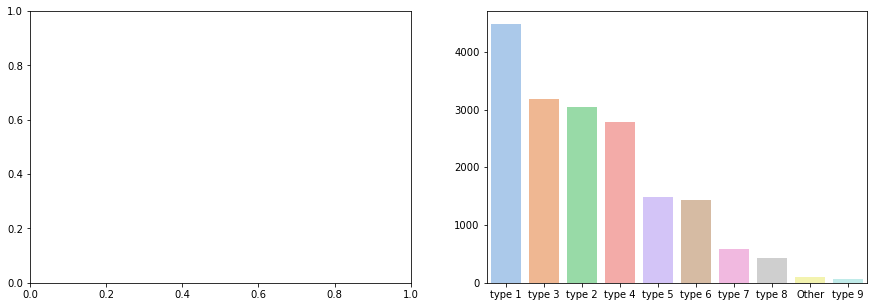

In [133]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [134]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 7,"[ki, raja, se, spray, logon, ne, ape, pardon, ...",37
1,deaths due covid what is vaccination rate what...,type 7,"[death, due, rate, free, safe, sir, gallian, n...",61
2,vaccination against covid- 19 is necessity tod...,type 3,"[nineteen, necessity, today, scenario, hoping,...",17
3,dr. deserved #1 minister's award his exception...,type 5,"[deserved, one, minister, award, exceptional, ...",32
4,"yeah i still do not get why, symptoms are much...",type 1,"[yeah, still, not, get, symptom, much, le, sev...",39


In [135]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [136]:
result = result.drop('Lemma-text', axis=1)

In [137]:
from wordcloud import WordCloud 

In [138]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

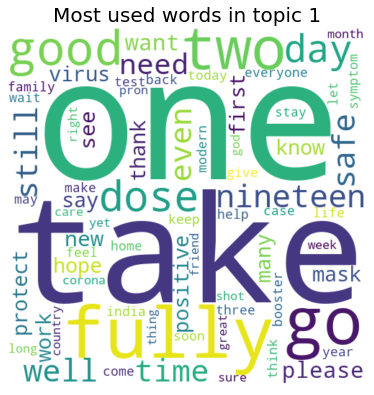

In [139]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

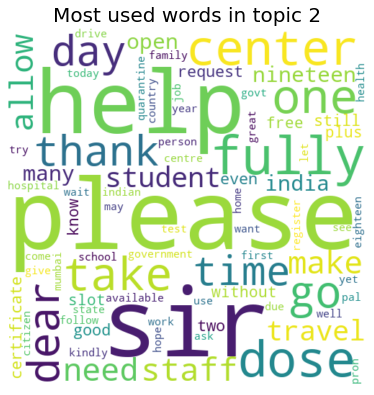

In [140]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

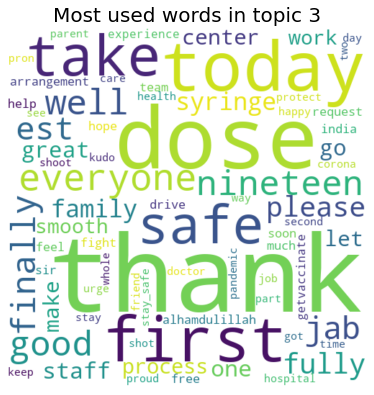

In [141]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

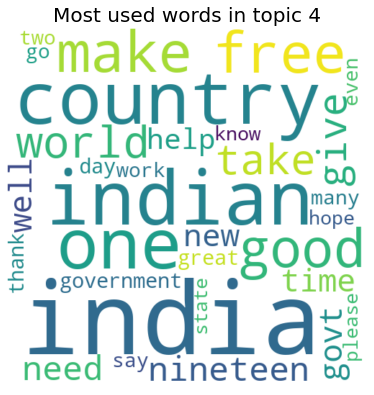

In [142]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

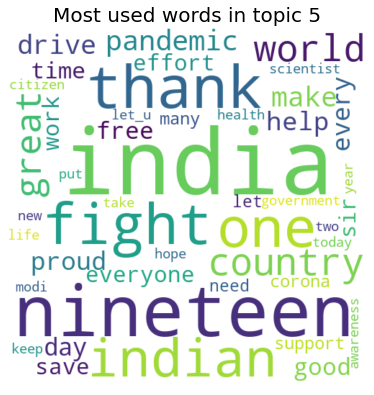

In [143]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

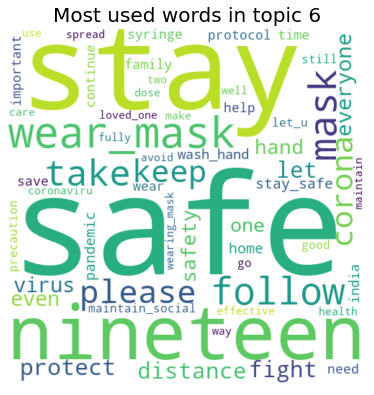

In [144]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

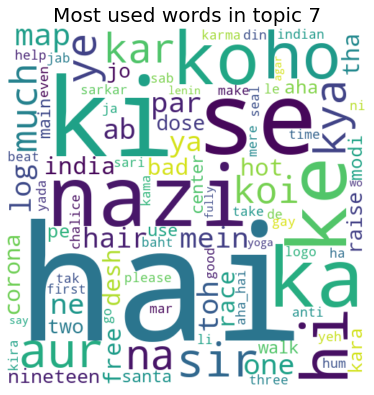

In [145]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

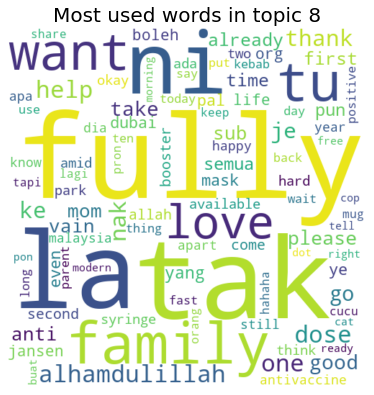

In [146]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

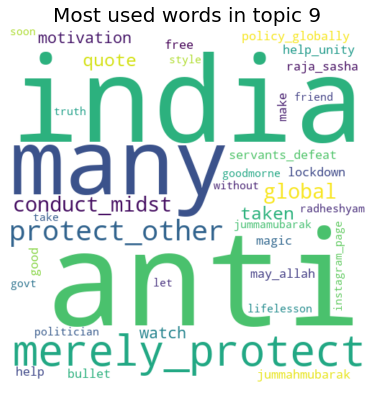

In [147]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 9")

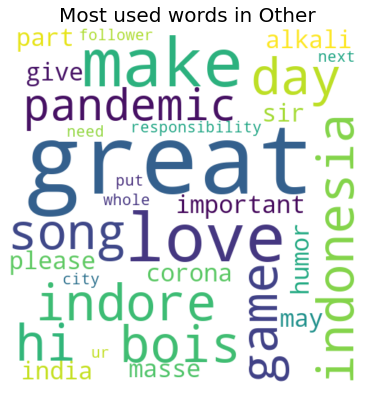

In [148]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")

### Cluster size: 10

In [149]:
mgp = MovieGroupProcess(K=10, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 14366 clusters with 10 clusters populated
In stage 1: transferred 10020 clusters with 10 clusters populated
In stage 2: transferred 7445 clusters with 10 clusters populated
In stage 3: transferred 5844 clusters with 10 clusters populated
In stage 4: transferred 4721 clusters with 10 clusters populated
In stage 5: transferred 4127 clusters with 10 clusters populated
In stage 6: transferred 3749 clusters with 10 clusters populated
In stage 7: transferred 3506 clusters with 10 clusters populated
In stage 8: transferred 3387 clusters with 10 clusters populated
In stage 9: transferred 3172 clusters with 10 clusters populated
In stage 10: transferred 3058 clusters with 10 clusters populated
In stage 11: transferred 3010 clusters with 10 clusters populated
In stage 12: transferred 2952 clusters with 10 clusters populated
In stage 13: transferred 2882 clusters with 10 clusters populated
In stage 14: transferred 2823 clusters with 10 clusters populated
In stage 15: trans

In [150]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [3375 4234 1404   18  607   84 4243   18  155 3456]

Most important clusters (by number of docs inside): [6 1 9 0 2 4 8 5 7 3]

Cluster 6 : [('not', 1426), ('india', 1356), ('get', 991), ('one', 562), ('country', 541), ('nineteen', 445), ('indian', 419), ('make', 415), ('world', 399), ('free', 386)]

Cluster 1 : [('get', 2024), ('not', 1517), ('safe', 688), ('take', 611), ('nineteen', 593), ('one', 505), ('mask', 449), ('stay', 405), ('good', 402), ('please', 391)]

Cluster 9 : [('get', 2494), ('thank', 1143), ('dose', 738), ('today', 667), ('first', 529), ('take', 461), ('safe', 405), ('nineteen', 352), ('everyone', 334), ('well', 297)]

Cluster 0 : [('not', 1422), ('get', 1342), ('please', 702), ('sir', 639), ('help', 574), ('fully', 439), ('dose', 402), ('one', 377), ('center', 307), ('take', 307)]

Cluster 2 : [('not', 500), ('get', 435), ('fully', 211), ('want', 176), ('go', 172), ('one', 170), ('two', 159), ('dose', 146), ('take', 145), ('modern', 

In [151]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8',
               'type 9',
               'type 10'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [152]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [153]:
mgp = MovieGroupProcess(K=9, alpha=0.1, beta=0.2, n_iters=30)

vocab = set(x for review in positive_tokenised_lemmatized for x in review)
n_terms = len(vocab)
model = mgp.fit(positive_tokenised_lemmatized, n_terms)

In stage 0: transferred 14231 clusters with 9 clusters populated
In stage 1: transferred 9679 clusters with 9 clusters populated
In stage 2: transferred 6786 clusters with 9 clusters populated
In stage 3: transferred 5149 clusters with 9 clusters populated
In stage 4: transferred 4487 clusters with 9 clusters populated
In stage 5: transferred 3993 clusters with 9 clusters populated
In stage 6: transferred 3571 clusters with 9 clusters populated
In stage 7: transferred 3368 clusters with 9 clusters populated
In stage 8: transferred 3208 clusters with 9 clusters populated
In stage 9: transferred 3200 clusters with 9 clusters populated
In stage 10: transferred 3067 clusters with 9 clusters populated
In stage 11: transferred 2968 clusters with 9 clusters populated
In stage 12: transferred 2999 clusters with 9 clusters populated
In stage 13: transferred 2937 clusters with 9 clusters populated
In stage 14: transferred 2964 clusters with 9 clusters populated
In stage 15: transferred 2821 clus

In [154]:
doc_count = np.array(mgp.cluster_doc_count)
print('Number of documents per topic :', doc_count)

# topics sorted by the number of document they are allocated to
top_index = doc_count.argsort()[-10:][::-1]
print('\nMost important clusters (by number of docs inside):', top_index)
# show the top 5 words in term frequency for each cluster 
top_words(mgp.cluster_word_distribution, top_index, 10)

Number of documents per topic : [4504   58  610   49 3039 4179 1513   79 3563]

Most important clusters (by number of docs inside): [0 5 8 4 6 2 7 1 3]

Cluster 0 : [('get', 1988), ('not', 1835), ('take', 622), ('safe', 616), ('one', 559), ('nineteen', 557), ('fully', 477), ('mask', 446), ('good', 413), ('even', 399)]

Cluster 5 : [('not', 1363), ('india', 1330), ('get', 1015), ('one', 563), ('country', 531), ('nineteen', 455), ('indian', 420), ('make', 418), ('world', 397), ('good', 397)]

Cluster 8 : [('get', 2589), ('thank', 1108), ('dose', 745), ('today', 683), ('first', 527), ('safe', 502), ('take', 473), ('nineteen', 378), ('everyone', 355), ('well', 319)]

Cluster 4 : [('get', 1244), ('not', 1173), ('please', 697), ('sir', 658), ('help', 581), ('dose', 360), ('center', 325), ('one', 311), ('fully', 299), ('take', 282)]

Cluster 6 : [('not', 487), ('get', 453), ('fully', 217), ('one', 191), ('want', 177), ('go', 167), ('take', 160), ('two', 159), ('dose', 144), ('modern', 128)]



In [155]:
# I don`t rename the clusters

topic_dict = {}
topic_names = ['type 1',
               'type 2',
               'type 3',
               'type 4',
               'type 5',
               'type 6',
               'type 7',
               'type 8',
               'type 9'
              ]
for i, topic_num in enumerate(top_index):
    topic_dict[topic_num]=topic_names[i] 

In [156]:
def create_topics_dataframe(data_text=positive_df.translated,  mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized):
    result = pd.DataFrame(columns=['Text', 'Topic', 'Lemma-text'])
    for i, text in enumerate(data_text):
        result.at[i, 'Text'] = text
        result.at[i, 'Lemma-text'] = lemma_text[i]
        prob = mgp.choose_best_label(positive_tokenised_lemmatized[i])
        if prob[1] >= threshold:
            result.at[i, 'Topic'] = topic_dict[prob[0]]
        else:
            result.at[i, 'Topic'] = 'Other'
    return result

In [157]:
result = create_topics_dataframe(data_text=positive_df.translated, mgp=mgp, threshold=0.3, topic_dict=topic_dict, lemma_text=positive_tokenised_lemmatized)
result.head(5)

,Text,Topic,Lemma-text
0,is covid ki waja se buht saray logon ne apne p...,type 6,"[ki, raja, se, spray, logon, ne, ape, pardon, ..."
1,deaths due covid what is vaccination rate what...,type 6,"[death, due, rate, free, safe, sir, gallian, n..."
2,vaccination against covid- 19 is necessity tod...,type 3,"[nineteen, necessity, today, scenario, hoping,..."
3,dr. deserved #1 minister's award his exception...,type 2,"[deserved, one, minister, award, exceptional, ..."
4,"yeah i still do not get why, symptoms are much...",type 1,"[yeah, still, not, get, symptom, much, le, sev..."


In [158]:
import plotly.express as px

fig = px.pie(result, names='Topic',  title='Topics', color_discrete_sequence=px.colors.sequential.Burg)
fig.show()

In [159]:
result['Topic']

0        type 6
1        type 6
2        type 3
3        type 2
4        type 1
          ...  
17589    type 1
17590    type 2
17591    type 4
17592    type 3
17593    type 1
Name: Topic, Length: 17594, dtype: object

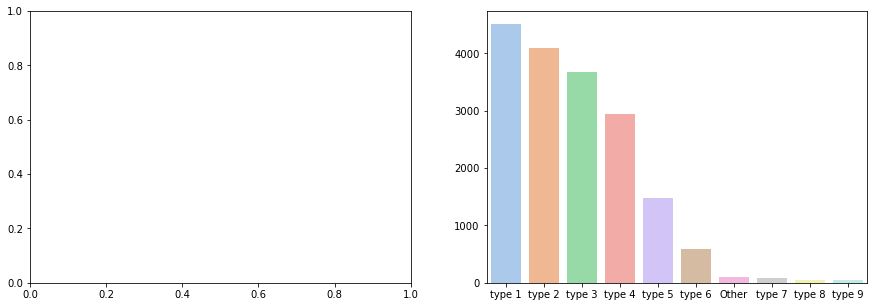

In [160]:
import matplotlib.pyplot as plt
import seaborn as sns
types_counts = result.Topic.value_counts()
fig, ax = plt.subplots(1, 2, figsize=(15,5))
types = sns.barplot(x = types_counts.index, y = types_counts.values, palette="pastel", ax=ax[1])


In [161]:
result['len'] = result.Text.apply(lambda row: len(row.split()))
result.head()

,Text,Topic,Lemma-text,len
0,is covid ki waja se buht saray logon ne apne p...,type 6,"[ki, raja, se, spray, logon, ne, ape, pardon, ...",37
1,deaths due covid what is vaccination rate what...,type 6,"[death, due, rate, free, safe, sir, gallian, n...",61
2,vaccination against covid- 19 is necessity tod...,type 3,"[nineteen, necessity, today, scenario, hoping,...",17
3,dr. deserved #1 minister's award his exception...,type 2,"[deserved, one, minister, award, exceptional, ...",32
4,"yeah i still do not get why, symptoms are much...",type 1,"[yeah, still, not, get, symptom, much, le, sev...",39


In [162]:
result['Lemma_text'] = result['Lemma-text'].apply(lambda row: ' '.join(row))

In [163]:
result = result.drop('Lemma-text', axis=1)

In [164]:
from wordcloud import WordCloud 

In [165]:
def create_WordCloud(data, title=None):
    wordcloud = WordCloud(width = 500, height = 500,
                          background_color ='white',
                          min_font_size = 15, collocations=False
                         ).generate(" ".join(data.values))
                      
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud, interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title(title,fontsize=20)
    plt.show() 

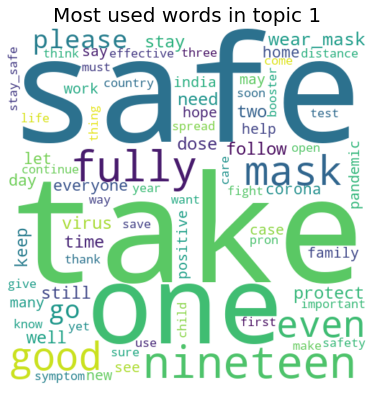

In [166]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 1'], title="Most used words in topic 1")

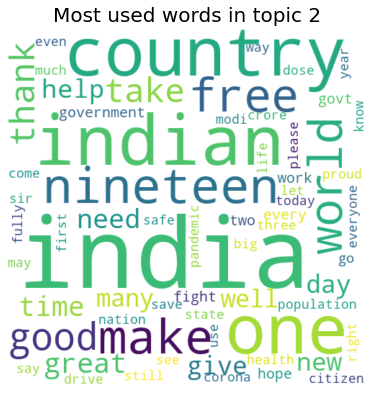

In [167]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 2'], title="Most used words in topic 2")

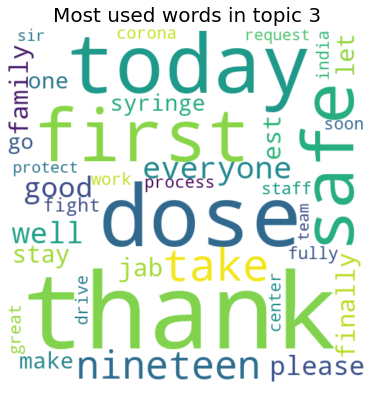

In [168]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 3'], title="Most used words in topic 3")

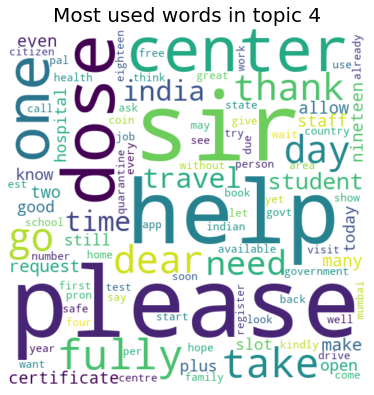

In [169]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 4'], title="Most used words in topic 4")

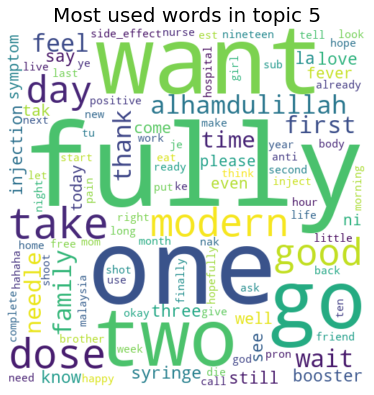

In [170]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 5'], title="Most used words in topic 5")

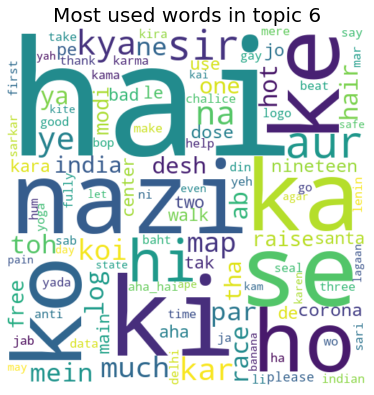

In [171]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 6'], title="Most used words in topic 6")

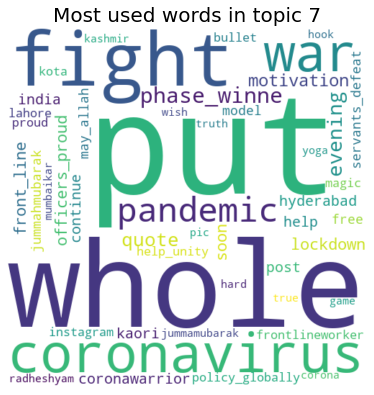

In [172]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 7'], title="Most used words in topic 7")

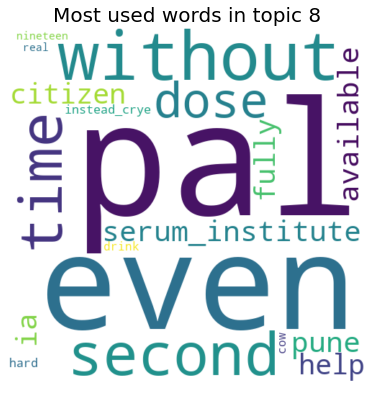

In [173]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 8'], title="Most used words in topic 8")

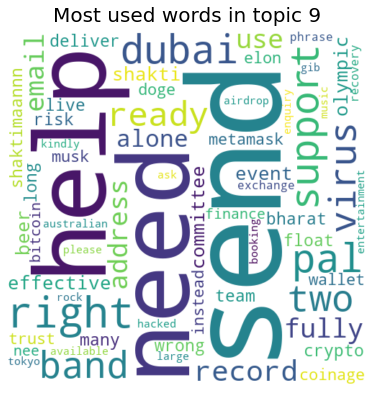

In [174]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 9")

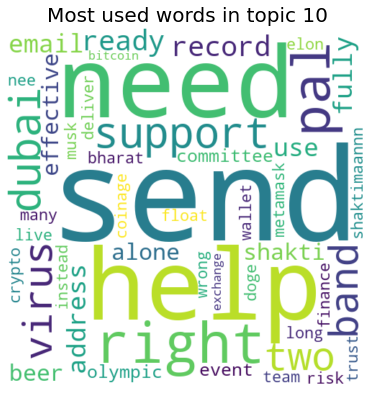

In [175]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'type 9'], title="Most used words in topic 10")

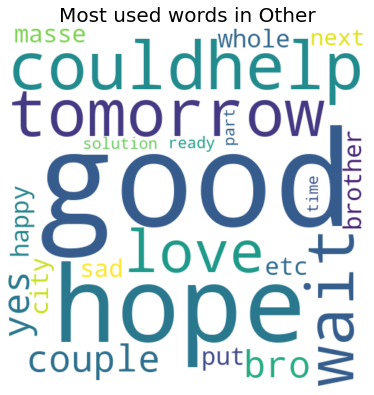

In [176]:
create_WordCloud(result['Lemma_text'].loc[result.Topic == 'Other'], title="Most used words in Other")